# PROJET : TATOUAGE DU SON

In [1]:
# enable plots in the notebook
import matplotlib.pyplot as plt
# makes our plots prettier
import seaborn
seaborn.set(style='ticks')

#import the audio playback widget
from IPython.display import Audio
from scipy import signal

# useful librairies
import mir_eval
import numpy as np
import scipy
import librosa
import librosa.display
from pydub import AudioSegment 
from ModulationPy import PSKModem, QAMModem

import wave
from scipy.io import wavfile
import contextlib

C:\Users\amaim\anaconda\lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


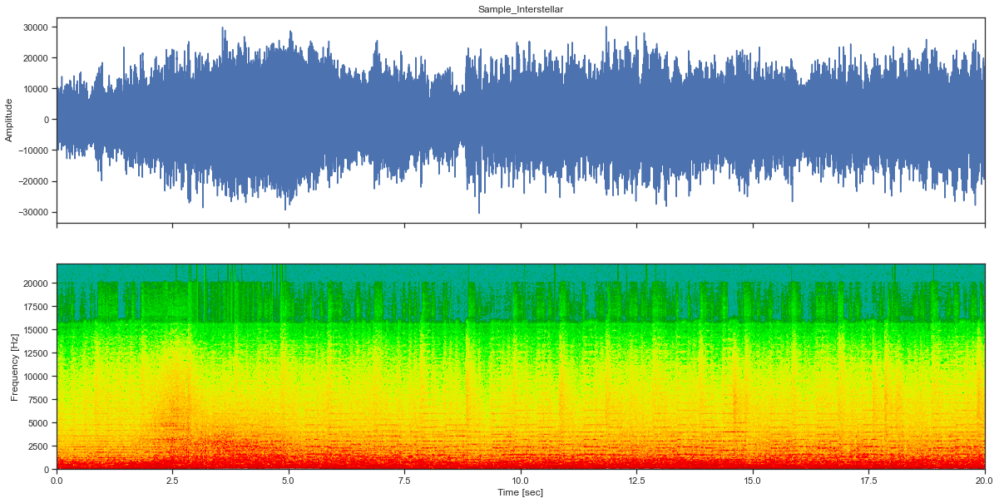

In [2]:
def interpret_wav(raw_bytes, n_frames, n_channels, sample_width, interleaved = True):

    if sample_width == 1:
        dtype = np.uint8 # unsigned char
    elif sample_width == 2:
        dtype = np.int16 # signed 2-byte short
    else:
        raise ValueError("Only supports 8 and 16 bit audio formats.")

    channels = np.frombuffer(raw_bytes, dtype=dtype)

    if interleaved:
        # channels are interleaved, i.e. sample N of channel M follows sample N of channel M-1 in raw data
        channels.shape = (n_frames, n_channels)
        channels = channels.T
    else:
        # channels are not interleaved. All samples from channel M occur before all samples from channel M-1
        channels.shape = (n_channels, n_frames)

    return channels

def get_start_end_frames(nFrames, sampleRate, tStart=None, tEnd=None):

    if tStart and tStart*sampleRate<nFrames:
        start = tStart*sampleRate
    else:
        start = 0

    if tEnd and tEnd*sampleRate<nFrames and tEnd*sampleRate>start:
        end = tEnd*sampleRate
    else:
        end = nFrames

    return (start,end,end-start)

def extract_audio(fname, tStart=None, tEnd=None):
    with contextlib.closing(wave.open(fname,'rb')) as spf:
        sampleRate = spf.getframerate()
        ampWidth = spf.getsampwidth()
        nChannels = spf.getnchannels()
        nFrames = spf.getnframes()

        startFrame, endFrame, segFrames = get_start_end_frames(nFrames, sampleRate, tStart, tEnd)

        # Extract Raw Audio from multi-channel Wav File
        spf.setpos(startFrame)
        sig = spf.readframes(segFrames)
        spf.close()

        channels = interpret_wav(sig, segFrames, nChannels, ampWidth, True)

        return (channels, nChannels, sampleRate, ampWidth, nFrames)

def convert_to_mono(channels, nChannels, outputType):
    if nChannels == 2:
        samples = np.mean(np.array([channels[0], channels[1]]), axis=0)  # Convert to mono
    else:
        samples = channels[0]

    return samples.astype(outputType)

def plot_specgram(samples, sampleRate, tStart=None, tEnd=None):
    plt.figure(figsize=(20,10))
    plt.specgram(samples, Fs=sampleRate, NFFT=1024, noverlap=192, cmap='nipy_spectral', xextent=(tStart,tEnd))
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.show()

def plot_audio_samples(title, samples, sampleRate, tStart=None, tEnd=None):
    if not tStart:
        tStart = 0

    if not tEnd or tStart>tEnd:
        tEnd = len(samples)/sampleRate

    f, axarr = plt.subplots(2, sharex=True, figsize=(20,10))
    axarr[0].set_title(title)
    axarr[0].plot(np.linspace(tStart, tEnd, len(samples)), samples)
    axarr[1].specgram(samples, Fs=sampleRate, NFFT=1024, noverlap=192, cmap='nipy_spectral', xextent=(tStart,tEnd))
    #get_specgram(axarr[1], samples, sampleRate, tStart, tEnd)

    axarr[0].set_ylabel('Amplitude')
    axarr[1].set_ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')

    plt.show()

tStart=0
tEnd=20

channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('sample_interstellar.wav', tStart, tEnd)
samples = convert_to_mono(channels, nChannels, np.int16)

plot_audio_samples("Sample_Interstellar", samples, sampleRate, tStart, tEnd)

In [3]:
#sound, soundr = librosa.load('sample_interstellar.wav')
Audio (samples,rate =sampleRate) 

# Filtrage du signal

In [46]:
def fir_high_pass(samples, fs, fH, N, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs

    # Compute sinc filter.
    h = np.sinc(2 * fH * (np.arange(N) - (N - 1) / 2.))
    # Apply window.
    h *= np.hamming(N)
    # Normalize to get unity gain.
    h /= np.sum(h)
    # Create a high-pass filter from the low-pass filter through spectral inversion.
    h = -h
    h[int((N - 1) / 2)] += 1
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)
    return s


def fir_low_pass(samples, fs, fL, N, outputType):
    # Referece: https://fiiir.com

    fL = fL / fs

    # Compute sinc filter.
    h = np.sinc(2 * fL * (np.arange(N) - (N - 1) / 2.))
    # Apply window.
    h *= np.hamming(N)
    # Normalize to get unity gain.
    h /= np.sum(h)
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)
    return s

def fir_band_reject(samples, fs, fL, fH, NL, NH, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs
    fL = fL / fs

    # Compute a low-pass filter with cutoff frequency fL.
    hlpf = np.sinc(2 * fL * (np.arange(NL) - (NL - 1) / 2.))
    hlpf *= np.blackman(NL)
    hlpf /= np.sum(hlpf)
    # Compute a high-pass filter with cutoff frequency fH.
    hhpf = np.sinc(2 * fH * (np.arange(NH) - (NH - 1) / 2.))
    hhpf *= np.blackman(NH)
    hhpf /= np.sum(hhpf)
    hhpf = -hhpf
    hhpf[int((NH - 1) / 2)] += 1
    # Add both filters.
    if NH >= NL:
        h = hhpf
        h[int((NH - NL) / 2) : int((NH - NL) / 2 + NL)] += hlpf
    else:
        h = hlpf
        h[int((NL - NH) / 2) : int((NL - NH) / 2 + NH)] += hhpf
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)

    return s

def fir_band_pass(samples, fs, fL, fH, NL, NH, outputType):
    # Referece: https://fiiir.com

    fH = fH / fs
    fL = fL / fs

    # Compute a low-pass filter with cutoff frequency fH.
    hlpf = np.sinc(2 * fH * (np.arange(NH) - (NH - 1) / 2.))
    hlpf *= np.blackman(NH)
    hlpf /= np.sum(hlpf)
    # Compute a high-pass filter with cutoff frequency fL.
    hhpf = np.sinc(2 * fL * (np.arange(NL) - (NL - 1) / 2.))
    hhpf *= np.blackman(NL)
    hhpf /= np.sum(hhpf)
    hhpf = -hhpf
    hhpf[int((NL - 1) / 2)] += 1
    # Convolve both filters.
    h = np.convolve(hlpf, hhpf)
    # Applying the filter to a signal s can be as simple as writing
    s = np.convolve(samples, h).astype(outputType)

    return s

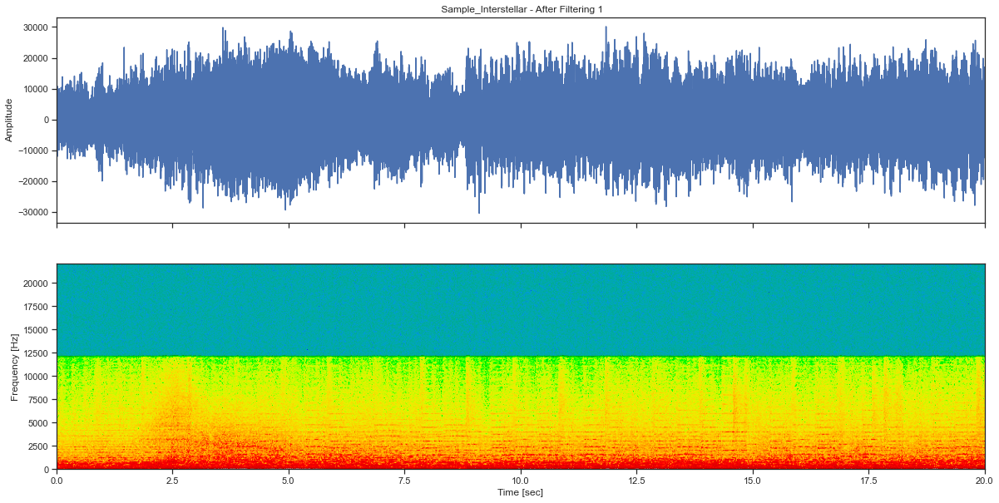

In [47]:
lp_samples_filtered = fir_low_pass(samples, sampleRate, 12000, 461, np.int16)             # First pass
lp_samples_filtered = fir_low_pass(lp_samples_filtered, sampleRate, 12000, 461, np.int16) # Second pass

plot_audio_samples(" Sample_Interstellar - After Filtering 1", lp_samples_filtered, sampleRate, tStart, tEnd)

In [65]:
Audio(data=lp_samples_filtered, rate = sampleRate)

# Traitement de l'image

In [66]:
from turtle import *
import math


"""
Description :
- Accepte toutes les dimensions de dessin (dans la limite du raisonnable, ne pas dépasser 30x30 pixel).
- PAR EXEMPLE pour dessiner le logo ESIEE, utilisez un fichier txt contenant ceci :

111110011111001000111110011111
110000011000001100110000011000
111110011111001100011110011111
110000000011001100110000011000
111110011111001100111110011111

- Ne pas oublier de fermer turtle avec la commande, bye().

"""


#dessin d'un pixel
def dessinerPixel(x , y):
    fillcolor("black")
    up()
    goto(x,y)
    down()
    begin_fill()
    for i in range(4):
        forward(20)
        left(90)
    end_fill()



#dessine l'image a partir du fichier txt mis en parametre
def dessinerASCII(nomFichier):
    #Variables
    x =-300
    y = 100

    #parametres du stylo
    speed(15)
    delay(0)
    hideturtle()

    fichier = open(nomFichier, "r")
    lignes = fichier.readlines()
    for ligne in lignes:
        for bit in ligne:
            if(bit == "1"):
                dessinerPixel(x , y)
            x+=20
        y-=20
        x=-300
    print("dessin terminé")

# Modulation 16-QAM

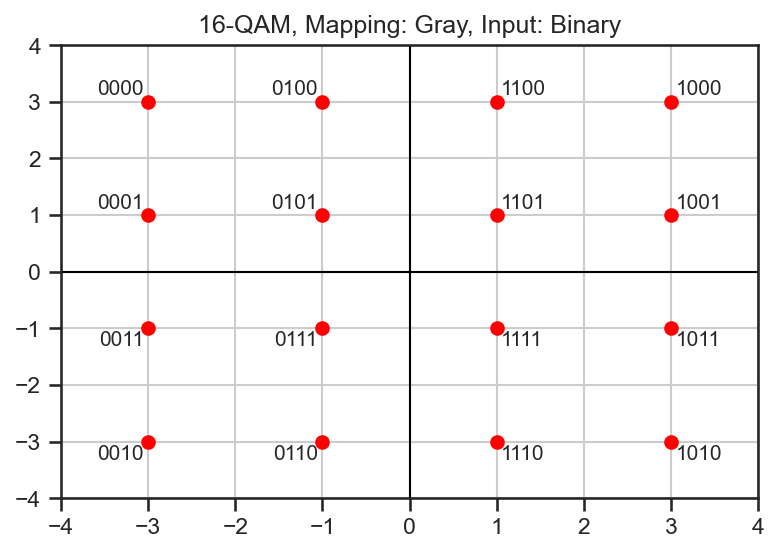

In [67]:
modem = QAMModem(16, 
                 bin_input=True,
                 soft_decision=False,
                 bin_output=True)
modem.plot_const()

In [68]:
def binaire(s):
    ords = (ord(c) for c in s)
    shifts = (7, 6, 5, 4, 3, 2, 1, 0)
    return [(o >> shift) & 1 for o in ords for shift in shifts]

def char(bits):
    chars = []
    for b in range(int(len(bits) / 8)):
        byte = bits[b*8:(b+1)*8]
        chars.append(chr(int(''.join([str(bit) for bit in byte]), 2)))
    return ''.join(chars)

texte = "L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide d’un micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceintes."
texte_bin = binaire(texte) #Texte convertit en binaire
texte_binaire = np.array(texte_bin)#Permet de convertir list en array

image = np.array([1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0,1,1,0,0,1,1,1,1,1,0,0,1,1,1,1,1,0,0]) # message d'entrée

msg = np.concatenate((image,texte_binaire)) #msg = image + texte que l'on souhaite transmettre 

print(msg[160:170])
print(texte_binaire[0:10])
print(len(texte))
print(msg.shape)
print(image.shape)
print(texte_binaire.shape)

[0 1 0 0 1 1 0 0 0 0]
[0 1 0 0 1 1 0 0 0 0]
533
(4424,)
(160,)
(4264,)


In [69]:
texte_char = char(texte_binaire) #Convertit du binaire au texte -> Vérification de la conversion en binaire
print(texte_char)

L'objectif de ce projet est de créer un système de communication permettant de transmettre de l'information, en l'occurrence une image via la diffusion d'une musique. Afin de parvenir à cet objectif, nous allons utiliser la technique du tatouage du son pour dissimuler les données de notre image dans les hautes fréquences, qui sont inaudibles à l'oreille humaine. Ensuite, à l'aide dun micro les capter, et après analyse retrouver l'image transmise. Pour ce faire nous disposons de 2 cartes Raspberry pi, un micro et des enceintes.


In [70]:
modulation = modem.modulate(msg) # modulation -> Moduler un tableau de bits en symboles de constellation
print ( " Message modulé : \n " + str (modulation)+ "\n")

demodulation = modem.demodulate(modulation) #démodulation
print ( " Message démodulé : \n " + str (demodulation))

 Message modulé : 
 [ 1.-1.j  3.+1.j  1.-1.j ... -3.-1.j -3.-3.j  1.-3.j]

 Message démodulé : 
 [1. 1. 1. ... 1. 1. 0.]


In [71]:
#ici on veut s'assurer qu'il n'y a pas eu d'erreur dans la modulation et la démodulation
np.array_equal(msg, demodulation)#On regarde si le message de base est égal à ce qu'on a obtenu apres la demodulation

True

In [72]:
symbols_real = modulation.real
symbols_imag = modulation.imag
print(symbols_real)
print(symbols_imag)

[ 1.  3.  1. ... -3. -3.  1.]
[-1.  1. -1. ... -1. -3. -3.]


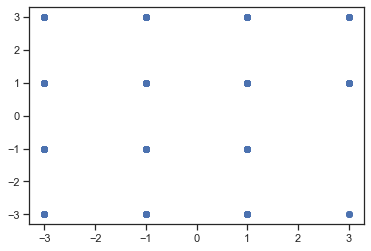

In [141]:
plt.scatter(np.real(modulation), np.imag(modulation))

# Convolution

In [73]:
#Etape 2 : convolution
import scipy
from commpy.filters import rcosfilter

Fsamp = 48000
Tsymbol = 200*(1/Fsamp)
alpha = 1/2
N = int(5*Tsymbol*Fsamp)
delta_symbols = np.zeros(len(modulation)*int(Tsymbol*Fsamp),dtype =complex)
delta_symbols[::int(Tsymbol*Fsamp)]= modulation



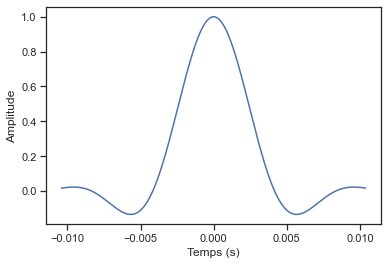

In [74]:
temps, h_rc = rcosfilter(N, alpha, Tsymbol, Fsamp)

plt.plot(temps, h_rc)
plt.ylabel('Amplitude')
plt.xlabel('Temps (s)')

plt.show()

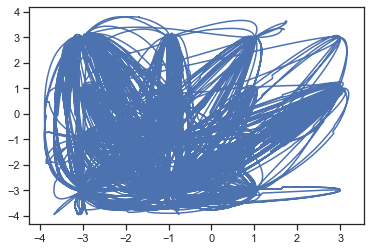

In [75]:
convo = np.convolve(delta_symbols , h_rc, mode="same") 
plt.figure()
plt.plot(np.real(convo), np.imag(convo))

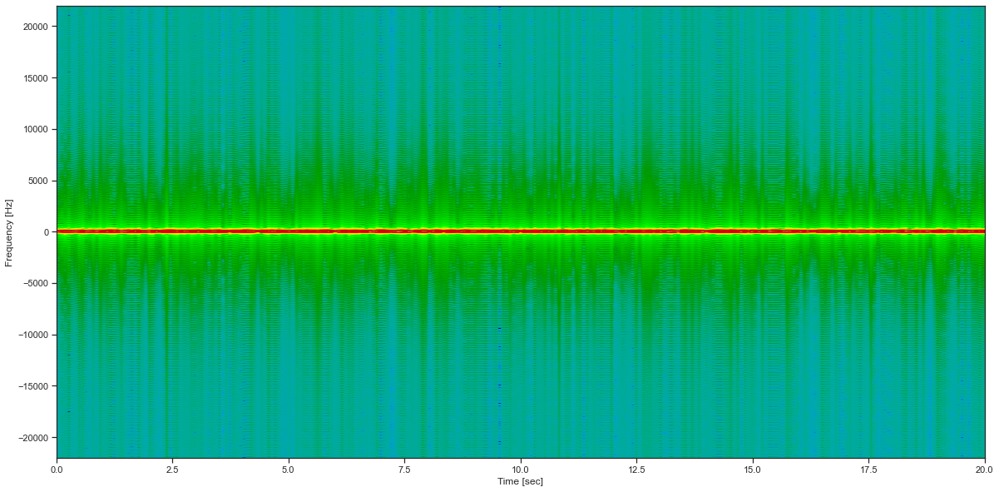

In [76]:
plot_specgram(convo, sampleRate,tStart, tEnd)

# 3. Shift en haute fréquence

In [190]:
Fcoupure = 16000 #Fréquence de coupure = milieu de la bande passante

t=np.linspace(0 , np.size(convo)/Fsamp , np.size(convo))
son = np.real(convo*np.exp(np.pi*2j*Fcoupure*t))
Audio ( data = son, rate = sampleRate)# ou sampleRate/2 ?

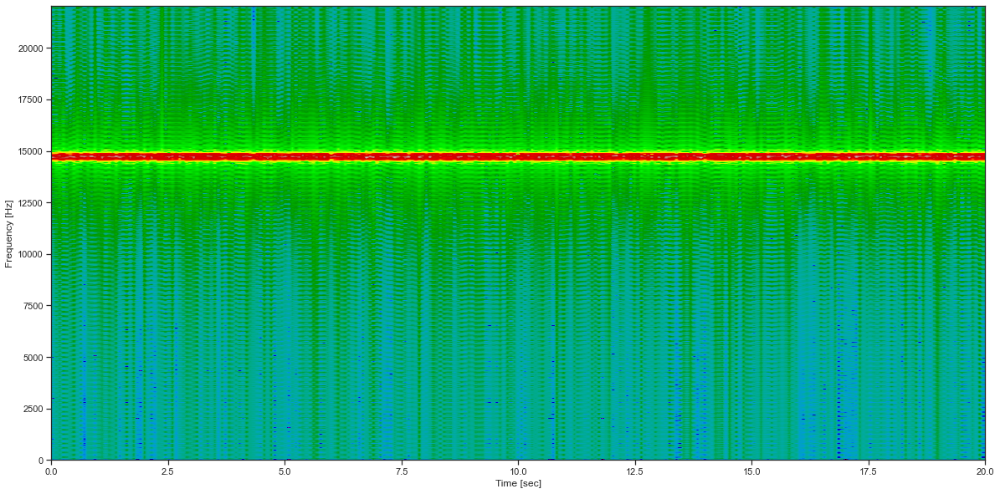

In [191]:
plot_specgram(son, sampleRate,tStart, tEnd)

In [192]:
from pydub import AudioSegment

song = AudioSegment.from_wav("son.wav")
# reduce volume by 10 dB
#song = song - 10

# but let's make him *very* quiet
song = song - 30

# save the output
song.export("quieters1.wav", "wav")

<_io.BufferedRandom name='quieters1.wav'>

In [193]:
sound1 = AudioSegment.from_file("son_filtre.wav") # son filtré 
sound2 = AudioSegment.from_file("quieters1.wav") 
tmpsound = sound1.overlay(sound2, position=0.15 * len(sound1))
tmpsound.export('tmpsounds1.wav',format='wav')

<_io.BufferedRandom name='tmpsounds1.wav'>

# EMETTEUR

# Filtrage des basses fréquences

In [194]:
channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('tmpsounds1.wav', tStart, tEnd)
samples2 = convert_to_mono(channels, nChannels, np.int16)

In [195]:
Audio(data= samples2,rate= sampleRate)

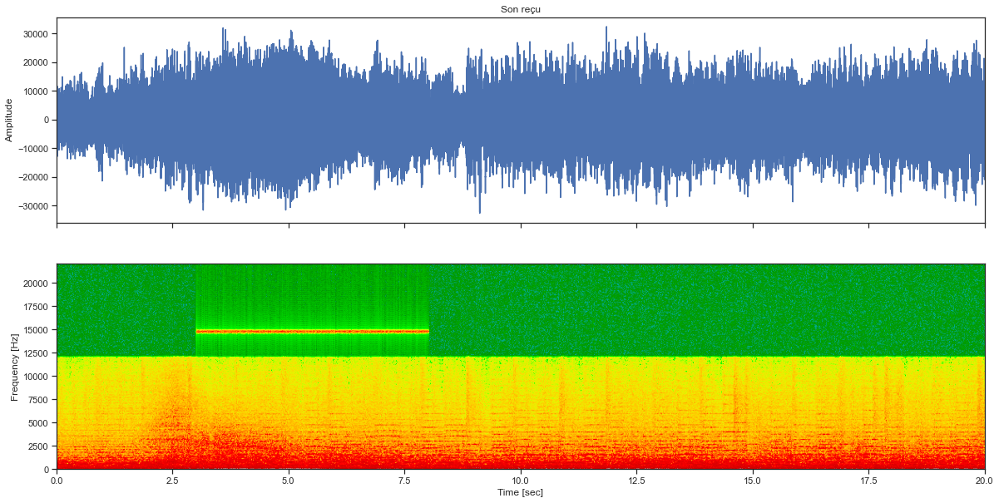

In [196]:
channels, nChannels, sampleRate, ampWidth, nFrames = extract_audio('son_info.wav', tStart, tEnd)
samples = convert_to_mono(channels, nChannels, np.int16)

plot_audio_samples("Son reçu", samples, sampleRate, tStart, tEnd)

C:\Users\amaim\anaconda\lib\site-packages\matplotlib\axes\_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


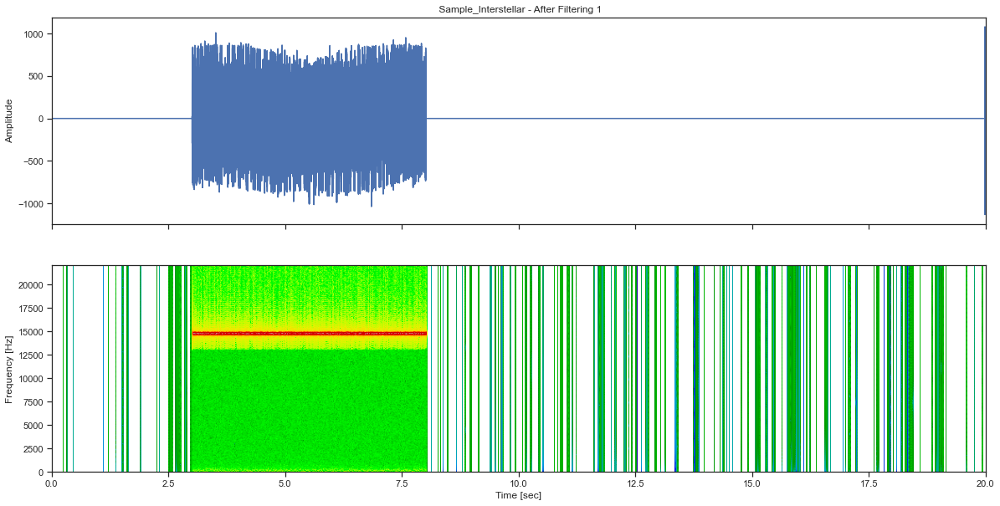

In [197]:
lh_samples_filtered = fir_high_pass(samples, sampleRate, 13000, 461, np.int16)             # First pass
lh_samples_filtered = fir_high_pass(lh_samples_filtered, sampleRate, 13000, 461, np.int16) # Second pass

plot_audio_samples(" Sample_Interstellar - After Filtering 1", lh_samples_filtered, sampleRate, tStart, tEnd)

In [198]:
Audio( data = lh_samples_filtered,rate = sampleRate)

# Démodulation de fréquence

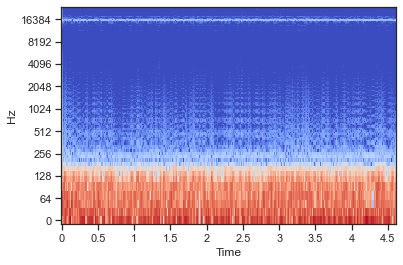

In [199]:
son_final = AudioSegment.from_file("msg_final.wav") #Audio récupéré après filtrage contenant notre message : texte+image

Fc = 16000 #Fréquence de coupure
temps = np.linspace(0,np.size(convo)/Fsamp, np.size(convo)) 

I_reel = son*2*np.cos(2*np.pi*Fc*temps) #composante réel en phase 
Q_quadrature = (-2)*son*np.sin(2*np.pi*Fc*temps) #composante réel en quadrature

If = librosa.stft(I_reel)
IdB = librosa.amplitude_to_db(abs(If))
plt.figure()
librosa.display.specshow(IF, sr=Fsamp, x_axis='time', y_axis='log')

In [211]:
I = np.convolve (I_reel, h_rc,'same')
Q = np.convolve (Q_quadrature, h_rc,'same')

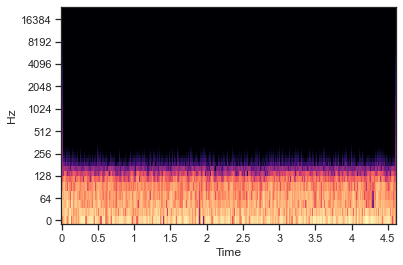

In [212]:
If2 = librosa.stft(I)
IdB2 = librosa.amplitude_to_db(abs(If2))

plt.figure()
librosa.display.specshow(IdB2, sr=Fsamp, x_axis='time', y_axis='log')

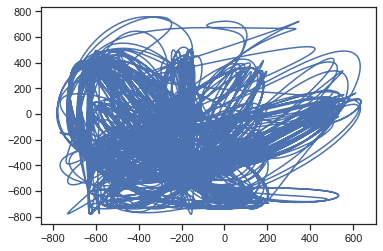

In [218]:
x_t = I+1j*Q #signal complexe en bande de base


plt.figure()
plt.plot(np.real(x_t),np.imag(x_t))

# Récupération de nos symboles

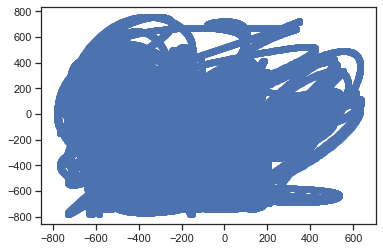

In [219]:
ech= comp_sig[::int(Tsymbol*Fsamp)] #Echantillonnage (surement à revoir)

plt.figure()
plt.scatter(np.real(x_t), np.imag(x_t))


#

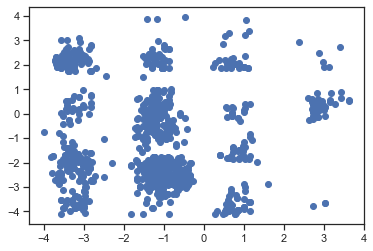

In [220]:
convo2 = np.convolve(h_rc,h_rc,'same')
Mconvo2 =np.max(convo2)

div =ech/Mconvo2

plt.figure()
plt.scatter(np.real(div), np.imag(div))

In [207]:
demodulation = modem.demodulate(jsp)
print(demodulation)

[1. 1. 1. ... 1. 1. 0.]
